In [1]:
import sys 
import numpy as np
import settings as s
import matplotlib.pyplot as plt 
import importlib
importlib.reload(s)
from cupyx.profiler import benchmark
import h5py
import os
import re
import time
import datetime

sys.path.insert(0, '../../../drlib')
import drlib as dr
%matplotlib widget

def mad_np(arr):
    median = np.median(arr)
    return np.median(np.abs(arr-median))

def freq2Idx(freq, freqsAll):
    return int(freq/freqsAll[-1] * len(freqsAll))

def idx2Freq(idx, freqs):
    return  ((freqs[-1] - freqs[0])/len(freqs) * idx) + freqs[0]

In [79]:
#play with text files

if s.MANUAL_ACQNUM < 0:
    #auto extract acquisition number
    acqNum = open('/drBiggerBoy/h5Testing_gitignore/text.txt', 'r'
                ).readlines()[-1].split(',')[0].strip()
    if not acqNum.isdigit():
        raise ValueError ('acquisition number in wrong location. Check database file. ')
else:
    acqNum = s.MANUAL_ACQNUM
acqNum

'2324534534535676765'

In [84]:
# CHECK DICTIONARY PROPERTIES

runInfoDict     = {'ACQ NUM' : acqNum, #number of spectra since start of run. Must be first
                    'DATETIME'          : datetime.datetime.now(),
                    'ANT POS IDX' : s.ANT_POS_IDX,
                    'LEN FFT LOG2' : int(np.log2(s.CH0_RECORD_LEN)),
                    'SAMPLE RATE MHZ' : s.SAMPLE_RATE/1e6,
                    }
if s.SAVE_AMP_CHAIN == 1:
    runInfoDict.update(s.SETUP_DICT)

runInfoDict

{'ACQ NUM': '2324534534535676765',
 'DATETIME': datetime.datetime(2023, 3, 3, 21, 20, 31, 55610),
 'ANT POS IDX': 0,
 'LEN FFT LOG2': 24,
 'SAMPLE RATE MHZ': 1250.0,
 'AMP1': 'ZKL_9VNom',
 'AMP2': 'ZKL_9VNom',
 'PATCH PANNEL': 'PATCH PANNEL',
 'ATTENUATOR': '10dB',
 'HPF': '288S+',
 'LPF': 'HSP50+',
 'ADC': 'ADQ32',
 'CLOCK': 'ADQ INTERNAL'}

In [89]:
import h5py
fileName    = s.SAVE_DIRECTORY+'data/'+str(0)+'.hdf5'
f       = h5py.File(fileName, 'a') 

FileNotFoundError: [Errno 2] Unable to create file (unable to open file: name = '/drBiggerBoy/drData/testing/data/0.hdf5', errno = 2, error message = 'No such file or directory', flags = 15, o_flags = c2)

In [2]:
import plotly.graph_objects as go; import numpy as np
from plotly_resampler import register_plotly_resampler
import panel as pn
import numpy as np
import dash
from dash import Dash, dcc, html
from base64 import b64encode
import io

app = Dash(__name__)
buffer = io.StringIO()

# Call the register function once and all Figures/FigureWidgets will be wrapped
# according to the register_plotly_resampler its `mode` argument
register_plotly_resampler(mode='MinMaxAggreator')

numPoints = 2**23

# generate some data
x = np.linspace(0, numPoints, numPoints)
noise = np.random.normal(0, 1, numPoints)
undulation = 2*np.sin(x * 4*2*np.pi/numPoints) + 2/numPoints*x

data = noise+undulation
data [3000000] = 20 + undulation[3000000]

print(data[3000000])
print(undulation[3000000])


# when working in an IPython environment, this will automatically be a
# FigureWidgetResampler else, this will be an FigureResampler
fig = go.Figure()
fig.add_trace({"y": data, "name": "yp2"})
fig.add_trace({"y": undulation})

fig.write_html(buffer)

html_bytes = buffer.getvalue().encode()
encoded = b64encode(html_bytes).decode()

app.layout = html.Div([
    html.H4('Simple plot export options'),
    html.P("↓↓↓ try downloading the plot as PNG ↓↓↓", style={"text-align": "right", "font-weight": "bold"}),
    dcc.Graph(id="graph-id", figure=fig),
    html.A(
        html.Button("Download as HTML"), 
        id="download",
        href="data:text/html;base64," + encoded,
        download="plotly_graph.html"
    )
])

# Register the callback
fig.register_update_graph_callback(app, "graph-id", "trace-updater")


app.run_server(debug=True)

21.56099240958211
1.5609924095821102
Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__' (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


/home/dradmin/.local/lib/python3.9/site-packages/traitlets/traitlets.py:2392: FutureWarning: Supporting extra quotes around strings is deprecated in traitlets 5.0. You can use 'hmac-sha256' instead of '"hmac-sha256"' if you require traitlets >=5.
  warn(
/home/dradmin/.local/lib/python3.9/site-packages/traitlets/traitlets.py:2346: FutureWarning: Supporting extra quotes around Bytes is deprecated in traitlets 5.0. Use 'e7ec06a3-c2b9-404b-ab75-79509b7d6c6e' instead of 'b"e7ec06a3-c2b9-404b-ab75-79509b7d6c6e"'.
  warn(
Traceback (most recent call last):
  File "/home/dradmin/.local/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "/home/dradmin/.local/lib/python3.9/site-packages/traitlets/config/application.py", line 975, in launch_instance
    app.initialize(argv)
  File "/home/dradmin/.local/lib/python3.9/site-packages/traitlets/config/application.py", line 110, in inner
    return method(app, *args, **kwargs)
  File "/home/dr

SystemExit: 1

/home/dradmin/.local/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3406: UserWarning:

To exit: use 'exit', 'quit', or Ctrl-D.



In [28]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
from plotly_resampler import FigureResampler
import numpy as np

ti = time.time()
numPoints = 2**18

# generate some data
x = np.linspace(0, numPoints, numPoints)
y = np.random.normal(0, 1, numPoints)
y[numPoints//2] = 5

# create a Plotly figure with two subplots
fig = make_subplots(rows=1, cols=1)

#fig = FigureResampler(go.Figure())

# add the downsampled data to the second subplot
fig.add_trace(go.Scattergl(x=x, y=y, mode='lines', name='Downsampled'), row=1, col=1)

# define the downsampling parameters
N = 1000  # target number of data points
resample_mode = 'lttb'  # use the LTTB algorithm

# create a plotly callback that downsamples the data and updates the figure
def update_figure(change):
    # get the new value of the slider
    new_N = change['new']
    
    # downsample the data using plotly.resample
    x_downsampled, y_downsampled = px.data.utils.downsample(x, y, new_N, mode=resample_mode)
    
    # update the downsampled subplot
    fig.data[1].x = x_downsampled
    fig.data[1].y = y_downsampled

'''
# create a slider that controls the number of data points in the downsampled data
slider = go.layout.Slider(
    visible=True,
    min=10,
    max=len(x),
    step=10,
    value=N,
    continuous_update=True,
    orientation='horizontal'
)

slider.on_change(lambda change: update_figure(change))

fig.update_layout(
    sliders=[slider],
    height=600,
    width=800,
)
'''
fig.show()

In [53]:
import plotly.graph_objects as go; import numpy as np
from plotly_resampler import register_plotly_resampler
import panel as pn
import numpy as np

# Call the register function once and all Figures/FigureWidgets will be wrapped
# according to the register_plotly_resampler its `mode` argument
register_plotly_resampler(mode='MinMaxAggreator')

numPoints = 2**23

# generate some data
x = np.linspace(0, numPoints, numPoints)
noise = np.random.normal(0, 1, numPoints)
undulation = 2*np.sin(x * 4*2*np.pi/numPoints) + 2/numPoints*x

data = noise+undulation
data [3000000] = 6 + undulation[3000000]

print(data[3000000])
print(undulation[3000000])


# when working in an IPython environment, this will automatically be a
# FigureWidgetResampler else, this will be an FigureResampler
f = go.Figure()
f.add_trace({"y": data, "name": "yp2"})
f.add_trace({"y": undulation})


# wrap the figure with panel
panel_figure = pn.pane.Plotly(f)

# create a panel app with the figure
app = pn.Column(panel_figure)

# serve the app
app.servable()

7.56099240958211
1.5609924095821102


Column
    [0] Plotly(FigureResampler)

In [32]:
#analysis



#avg = np.load('./avgPowSpec_9p3hours_sSkip2_1p15GHzSample_2to24ptFFT_dBm_2_27_23_gitignore.npy')
antSpec = np.load('./powSpecAnt.npy')
termSpec = np.load('./powSpecTerm.npy')

avg = np.load('./powSpec_2p5e6Avg_8dBAtt_33553sec_2xzkl1r5_50HPF_300LPF_3_1_23.npy') #mw
#avg = dr.fft2Watts(np.load('./../../run1Analysis/run1_antData_avgAll11776Spectra_gitignore.npy'))
#avg = antSpec-termSpec


sampleRate = 2.5e9/2 #GHz
freqs = np.linspace(0, sampleRate/2, s.CH0_RECORD_LEN//2 )


#filter and plot with 5sigma limit. Note these are not gain corrected!!!
nSigma = 5
order = 1
fc_numBins = 100

specFiltered = dr.filterSpec(avg, fc_numBins=fc_numBins, order=order)
window = 1000

rollingMadArr = dr.rolling(specFiltered, window, 1, mad_np, numProc=48)

filter_fc           = 30 * window
filteredMadArr  = dr.filterSpec(rollingMadArr, order = 2, fc_numBins = filter_fc, type = 'lowpass')
diffFilterMadPadArr = dr.nanPad(filteredMadArr, window)
rollMadLim      = diffFilterMadPadArr * nSigma * 1.48

done mp


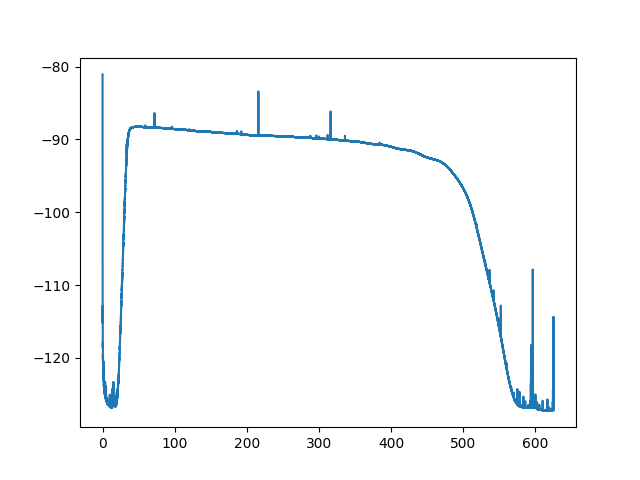

In [36]:
plt.close('all')
plt.figure()
plt.plot(np.linspace(0,625,2**23),10*np.log10(avg)[1:])


72 candidates


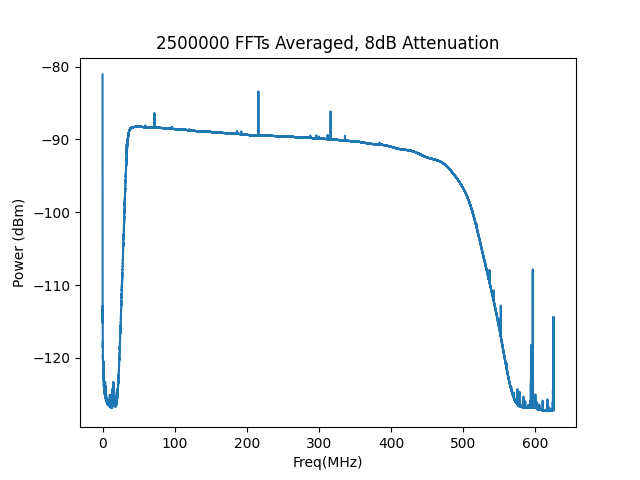

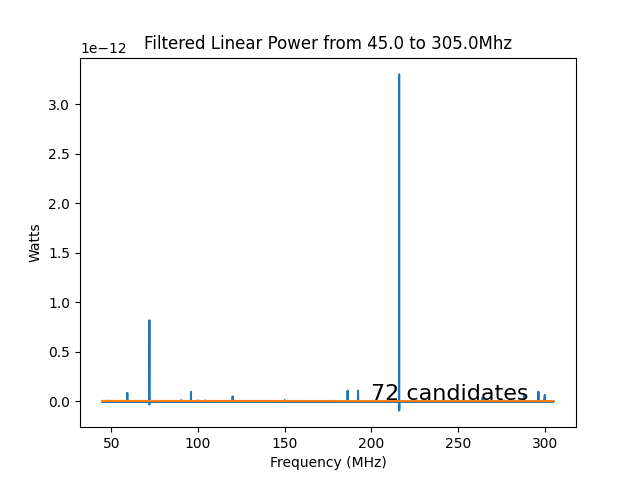

In [45]:
pltFreqStart = 45e6
pltFreqStop = 305e6
pltIdxStart = freq2Idx(pltFreqStart, freqs)
pltIdxStop = freq2Idx(pltFreqStop, freqs)

spurList_idx = ((specFiltered > rollMadLim))
candidateTotal = (spurList_idx[pltIdxStart:pltIdxStop].sum())
print(f"{candidateTotal} candidates")
#print((freqs[pltIdxStart:pltIdxStop][spurList_idx[pltIdxStart:pltIdxStop]]))

plt.close('all')

if 1:
    #dBm of single spec
    plt.figure()
    plt.title(f"{s.NOF_BUFFERS_TO_RECEIVE} FFTs Averaged, 8dB Attenuation")
    plt.plot(np.linspace(0,1250/s.CH0_SAMPLE_SKIP_FACTOR,s.CH0_RECORD_LEN//2),10*np.log10(avg)[1:])
    plt.xlabel('Freq(MHz)')
    plt.ylabel('Power (dBm)')
    plt.plot()
    plt.show()

if 1:
    plt.figure()
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6, specFiltered[pltIdxStart:pltIdxStop]/1000)
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6,(rollMadLim)[pltIdxStart:pltIdxStop]/1000)
    plt.text(200,10e-15, f'{candidateTotal} candidates',size=16)
    plt.title(f"Filtered Linear Power from {pltFreqStart/1e6} to {pltFreqStop/1e6}Mhz")
    plt.xlabel('Frequency (MHz)')
    plt.ylabel('Watts')

if 0:
    plt.figure()
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6, specFiltered[pltIdxStart:pltIdxStop])
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6,(rollMadLim)[pltIdxStart:pltIdxStop])
    plt.text(200,4e-12, f'{candidateTotal} candidates',size=16)
    plt.title(f"Filtered Linear Power from {pltFreqStart/1e6} to {pltFreqStop/1e6}Mhz")
    plt.xlabel('Frequency (MHz)')
    plt.ylabel('Watts')



In [3]:
#compute expected power
roomTemp                = 293 #k 
NF                      = 3#dB
ampTemp                 = 290  * (10**(NF/10) - 1)
sysTemp                 = ampTemp + roomTemp
print('System temp = ', round(sysTemp, 2), 'K')

sampleRate              = 2.5e9/4
kb                      = 1.380649e-23 #J/K
deltaNu                 = (sampleRate/2)/(s.CH0_RECORD_LEN/2) #Hz
#deltaNu = 10e3
print(deltaNu)

thermalNoiseDens        = kb * sysTemp #W/Hz

thermalNoiseDens_dBm    = 10*np.log10(thermalNoiseDens * 1000)
thermalBg_dBm           = 10*np.log10(thermalNoiseDens * deltaNu * 1000)

print('total thermal background = ', round(thermalNoiseDens_dBm, 2), 'dBm per Hz')
print('total thermal background = ', round(thermalBg_dBm, 2), 'dBm per bin')

def dBm2linPow(dBm):
    return(10**((dBm - 30) /10))

print('thermal background = ', dBm2linPow(thermalBg_dBm), 'W per bin')

ampGain         = 38.67*2 #dB
attenuation     = (0
                    +12
                    +2) #dB

expectedPow         = (thermalBg_dBm
                    + ampGain 
                    - attenuation) #dBm

print(f"expected power: {expectedPow} dBm")

System temp =  581.63 K
37.25290298461914
total thermal background =  -170.95 dBm per Hz
total thermal background =  -155.24 dBm per bin
thermal background =  2.9914880311893224e-19 W per bin
expected power: -91.90112730411383 dBm


/home/dradmin/.local/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


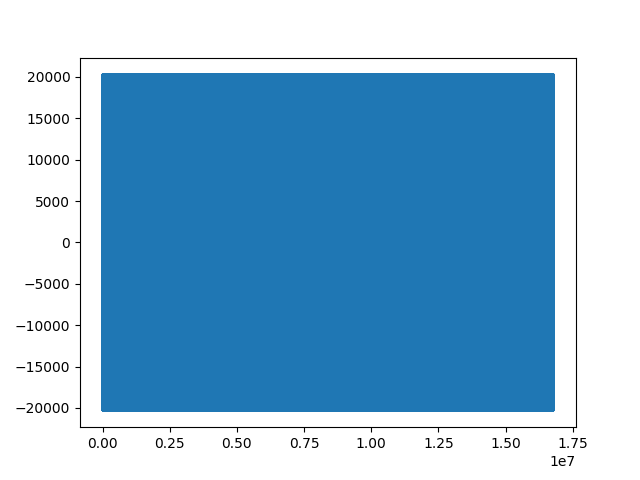

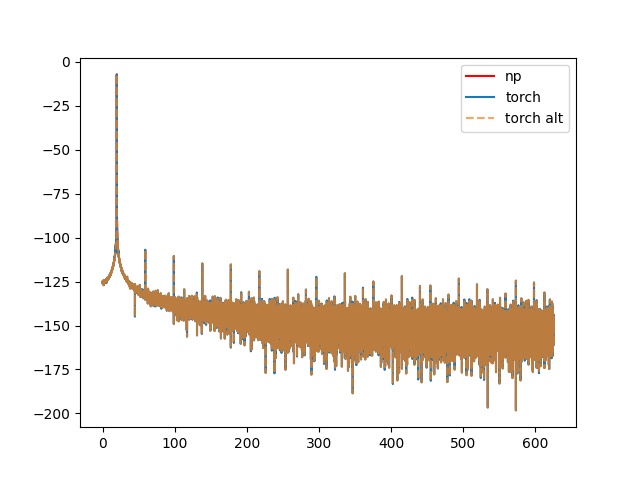

In [18]:
#sim fft
#note int16 have rounding error. Does not affect amplitude of high level signal (to 0.0002dB)
%matplotlib widget
import torch
import cupy as cp

time            = np.linspace(0,2**24/1.25e9,2**24)
arr             = np.asarray(20300*np.sin(2*np.pi*time*19.7562e6))
arrGpu          = cp.asarray(arr)

arr_torch       = torch.as_tensor(arrGpu, dtype=torch.int16, device='cuda')

fft             = abs(np.fft.rfft(arr)[1:])**2
specmW          = fft * 2**-34*2/(50*(2**24)**2)*1000

fft_torch       = torch.pow(torch.abs(torch.fft.rfft(arr_torch)),2)
specmW_torch    = np.asarray((fft_torch * 2**-34*2/(50*(2**24)**2)*1000).cpu())

fft_torch_raw   = (torch.fft.rfft(arr_torch))
fft_torch_alt   = fft_torch_raw*torch.conj(fft_torch_raw)
specmW_torch_alt= np.asarray((fft_torch_alt * 2**-34*2/(50*(2**24)**2)*1000).cpu())

plt.close('all')
plt.figure()
plt.plot(arr)

plt.figure()
plt.plot(np.linspace(0,625e6, 2**23)/1e6,10*np.log10(specmW),'r', label = 'np')
plt.plot(np.linspace(0,625e6, 2**23)/1e6,10*np.log10(specmW_torch)[1:], label = 'torch', alpha = 1)
plt.plot(np.linspace(0,625e6, 2**23)/1e6,10*np.log10(specmW_torch_alt)[1:], '--', label = 'torch alt', alpha = .7)
plt.legend()

In [6]:
def fft_torch_conj(arr_torch):
    fft_torch_raw   = (torch.fft.rfft(arr_torch))
    return    fft_torch_raw*torch.conj(fft_torch_raw)
    

def fft_torch_abs(arr_torch):
    return        torch.pow(torch.abs(torch.fft.rfft(arr_torch)),2)

print(benchmark(fft_torch_abs, (arr_torch,), n_repeat = 200))
print(benchmark(fft_torch_conj, (arr_torch,), n_repeat = 200))

fft_torch_abs       :    CPU:   49.273 us   +/- 3.513 (min:   46.619 / max:   76.319) us     GPU-0: 1415.297 us   +/-13.329 (min: 1401.856 / max: 1500.160) us
fft_torch_conj      :    CPU:   41.367 us   +/- 1.687 (min:   39.199 / max:   48.929) us     GPU-0: 1464.567 us   +/-44.702 (min: 1449.984 / max: 2070.528) us


In [66]:
def f(settings):
    print(settings.CH0_DBS_BYPASS)
f(s.CH0_DBS_BYPASS)

AttributeError: 'int' object has no attribute 'CH0_DBS_BYPASS'

In [72]:
dataTest = np.load('./timeDomainBuffer.npy')
type(dataTest)

numpy.ndarray

# Time Delta Analysis

diff mean:              6.720936925331473
diff median:            6.71831
diff STD:               0.20906045958854483
diff percent error:     3.1105850554940906
expected single time:   6.710886400000001
total time:             28893.307842
expected total time:    13.421772800000001


Text(0, 0.5, 'Time Delta (Seconds)')

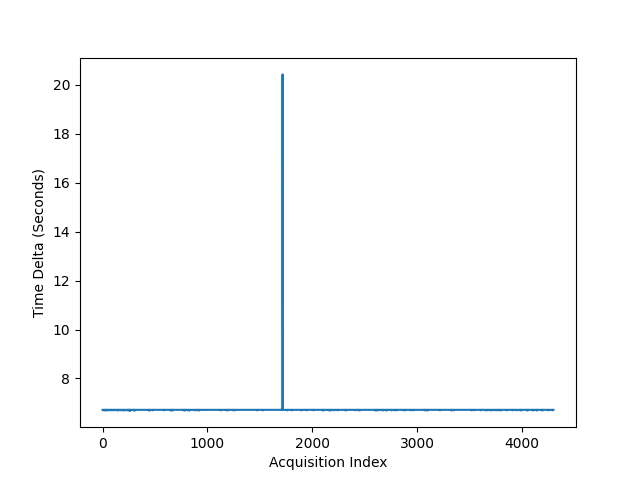

In [14]:
from datetime import datetime

datetimes_str = np.loadtxt('/drBiggerBoy/testing/database.txt',
                        skiprows=1,
                        usecols=1,
                        delimiter=',',
                        dtype=str)
datetimes =[]
for date in datetimes_str:
    data = date[10]
    datetimes.append(datetime.strptime(date, ' %Y-%m-%d %H:%M:%S.%f'))


diff = []
for i in range(len(datetimes)-1):
    diff.append((datetimes[i+1] - datetimes[i]).total_seconds())

print(f"diff mean:              {np.mean(diff)}")
print(f"diff median:            {np.median(diff)}")
print(f"diff STD:               {np.std(diff)}")
print(f"diff percent error:     {np.std(diff)/np.mean(diff) * 100}")
print(f"expected single time:   {2**24/s.SAMPLE_RATE * 250}")
print(f"total time:             {(datetimes[-1] - datetimes[0]).total_seconds()}")
print(f"expected total time:    {2**24/s.SAMPLE_RATE * s.NOF_BUFFERS_TO_RECEIVE * s.NOF_ACQUISITIONS_TO_TAKE}")

plt.close('all')
plt.figure()
plt.plot(diff)
plt.xlabel('Acquisition Index')
plt.ylabel('Time Delta (Seconds)')


# Post process H5 files for switching test

In [22]:
#pack pre proc dataset

try:
    f.close()
    print("closed")
except:
    print("didn't close")
    pass

rawDataDir      = '/drBiggerBoy/testing/data/'
fileList        = os.listdir(rawDataDir)
fileList.sort(key=lambda f: int(re.sub('\D', '', f)))
newDataDir      = '/drBiggerBoy/testing/'
fileName        = 'packedh5.hdf5'
if 1: #will overwrite!!!

    f               = h5py.File(newDataDir + fileName, 'w')

    #init empty dataset
    spec_W    = f.create_dataset('spec_W_chB', (8388609, 4300), chunks = (2**16,2**0), dtype = 'f')

    ##############################################################
    #Main loop
    ##############################################################
    numFiles        = 0
    numMeasData     = 0
    numRigolSpec    = 0

    compType = False
    chunks = None #must add chunks arg to create dataset calls

    for fileidx, file in enumerate(fileList):
        if fileidx % 10 == 0:
            print(file)
        dataset         = h5py.File(rawDataDir +  file, 'r')
        numFiles        += 1
        measDataKeys    = list(dataset.keys())
        measDataKeys.sort(key=lambda f: int(re.sub('\D', '', f)))
        #measDataKeys = [int(key) for key in measDataKeys]

        for measData in measDataKeys:
            measDataInt = int(measData)
            '''Dumb check. Is the date in raw h5 measData the same as what
            the database thinks it is? Since we previously check that dates
            are consectutive this also checks that dates 
            in raw h5 are consecutive'''
            '''datasetDf   = pd.read_hdf(rawDataDir + file, key = measData)#raw H5 
            dateTimeStr = datasetDf.columns[0][0]#datetime extracted from raw H5
            dateTime    = datetime.strptime(dateTimeStr, '%Y-%m-%d %H:%M:%S.%f')'''

            '''Check database at a measData has the same datetime as we are about
            to load into new h5'''
            '''if not (dateTime==database[database['measData'] == measDataInt].index):
                print('Dates got jumbled at measData', measDataInt)'''

            spec_W_np        = np.float32(dataset[measData]['chBSpec_W'])
            #termSpec    = np.float32(dr.fft2Watts(datasetDf.iloc[:,0][:]))
            #diffSpec    = np.float32((antSpec-termSpec))

            spec_W[:, measDataInt]    = spec_W_np

f.close()

closed
0.hdf5
10.hdf5
20.hdf5
30.hdf5
40.hdf5
50.hdf5
60.hdf5
70.hdf5
80.hdf5
90.hdf5
100.hdf5
110.hdf5
120.hdf5
130.hdf5
140.hdf5
150.hdf5
160.hdf5
170.hdf5
180.hdf5
190.hdf5
200.hdf5
210.hdf5
220.hdf5
230.hdf5
240.hdf5
250.hdf5
260.hdf5


In [32]:
# Average specs with different switching times

#location of packed h5
newDataDir      = '/drBiggerBoy/testing/'
fileName        = 'packedh5.hdf5'

#location to save new file
saveDir = './switchTesting_3_5_23_gitignore/'

f               = h5py.File(newDataDir + fileName, 'r')
print(f['spec_W_chB'])

#chat gpt code to make list of idx to average
if 1:
    length = 4300
    step_sizes = [6,8,10,15,20,50,100,500,1000,1500,2000]
    for step_size in step_sizes:
        print(f"on step size {step_size}")
        idx_sets = np.arange(length) // step_size
        include_in_first = (idx_sets % 2 == 0)
        first_idx = np.arange(length)[include_in_first]
        second_idx = np.arange(length)[~include_in_first]
        if len(first_idx) > len(second_idx):
            first_idx = first_idx[:len(second_idx)]
        print(first_idx[0:10])
        print(second_idx[0:10])


        sum = np.zeros(2**23+1)
        for i in first_idx:
            sum += f['spec_W_chB'][:,i]
        avgSpec1 = sum/len(first_idx)

        print('did first one')
        sum = np.zeros(2**23+1)
        for i in second_idx:
            sum += f['spec_W_chB'][:,i]
        avgSpec2 = sum/len(second_idx)

        np.save(saveDir + f'switchEvery{step_size}Acq_spec1', avgSpec1 )
        np.save(saveDir + f'switchEvery{step_size}Acq_spec2', avgSpec2 )


    f.close()



<HDF5 dataset "spec_W_chB": shape (8388609, 4300), type "<f4">
on step size 6
[ 0  1  2  3  4  5 12 13 14 15]
[ 6  7  8  9 10 11 18 19 20 21]
did first one
on step size 8
[ 0  1  2  3  4  5  6  7 16 17]
[ 8  9 10 11 12 13 14 15 24 25]
did first one
on step size 10
[0 1 2 3 4 5 6 7 8 9]
[10 11 12 13 14 15 16 17 18 19]
did first one
on step size 15
[0 1 2 3 4 5 6 7 8 9]
[15 16 17 18 19 20 21 22 23 24]
did first one
on step size 20
[0 1 2 3 4 5 6 7 8 9]
[20 21 22 23 24 25 26 27 28 29]
did first one
on step size 50
[0 1 2 3 4 5 6 7 8 9]
[50 51 52 53 54 55 56 57 58 59]
did first one
on step size 100
[0 1 2 3 4 5 6 7 8 9]
[100 101 102 103 104 105 106 107 108 109]
did first one
on step size 500
[0 1 2 3 4 5 6 7 8 9]
[500 501 502 503 504 505 506 507 508 509]
did first one
on step size 1000
[0 1 2 3 4 5 6 7 8 9]
[1000 1001 1002 1003 1004 1005 1006 1007 1008 1009]
did first one
on step size 1500
[0 1 2 3 4 5 6 7 8 9]
[1500 1501 1502 1503 1504 1505 1506 1507 1508 1509]
did first one
on step size 

In [2]:
# Plot data generated above

%matplotlib widget

avgSpec1 = np.load('./switchTesting_3_5_23_gitignore/switchEvery1Acq_spec1.npy')
avgSpec2 = np.load('./switchTesting_3_5_23_gitignore/switchEvery6Acq_spec2.npy')

freqs=np.linspace(0,s.SAMPLE_RATE/2, 2**23)
mean_spec1 = np.mean(avgSpec1[1300000:1400000])
std_spec1 = np.std(avgSpec1[1300000:1400000])
addBackground = np.random.normal(mean_spec1/2, std_spec1/2, 2**23+1) * 0
fake_sig    = np.zeros(2**23+1)
fake_sig[4000000] = 1e-14 *0 #298.02MHz

antSpec = avgSpec1 + fake_sig
termSpec = avgSpec2 + addBackground

diffSpec = antSpec-termSpec
diffSpec = antSpec1

plt.close('all')
plt.figure()
plt.plot(freqs/1e6,10*np.log10(antSpec*1000)[1:], label = '"Ant"')
plt.plot(freqs/1e6,10*np.log10(termSpec*1000)[1:], alpha = .5, label = '"Term"')
plt.title('All Data Averaged')
plt.xlabel('Freq (MHz)')
plt.ylabel('Power (dBm)')
plt.legend(loc='upper right')

plt.figure()
plt.plot(freqs/1e6,(antSpec)[1:], label = '"Ant"')
plt.plot(freqs/1e6,(termSpec)[1:], alpha = .5, label = '"Term"')
plt.title('All Data Averaged')
plt.xlabel('Freq (MHz)')
plt.ylabel('Power (Watts)')
plt.legend(loc='upper right')



plt.figure()
plt.plot(freqs/1e6, (diffSpec)[1:])
plt.xlabel('Freq (MHz)')
plt.ylabel('Power (Watts)')

NameError: name 'antSpec1' is not defined

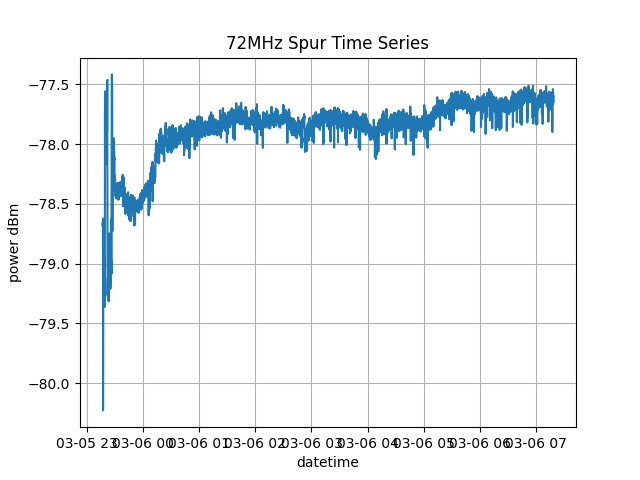

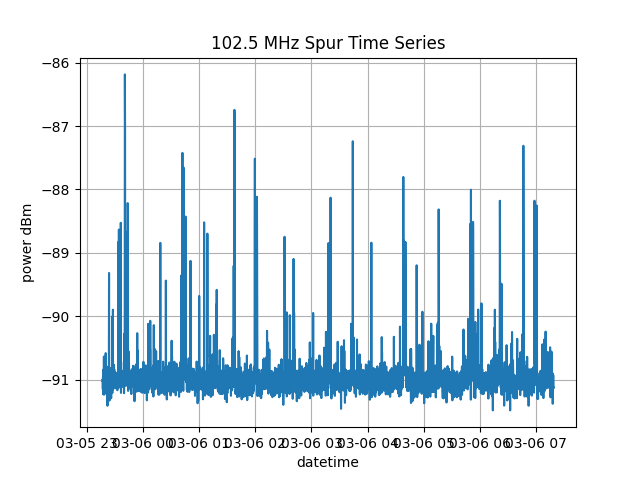

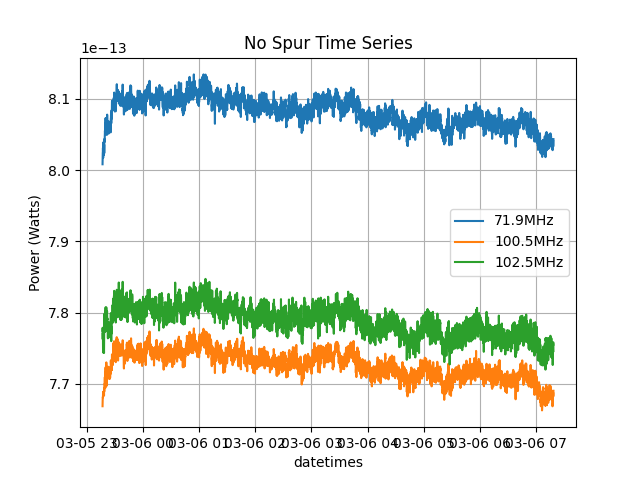

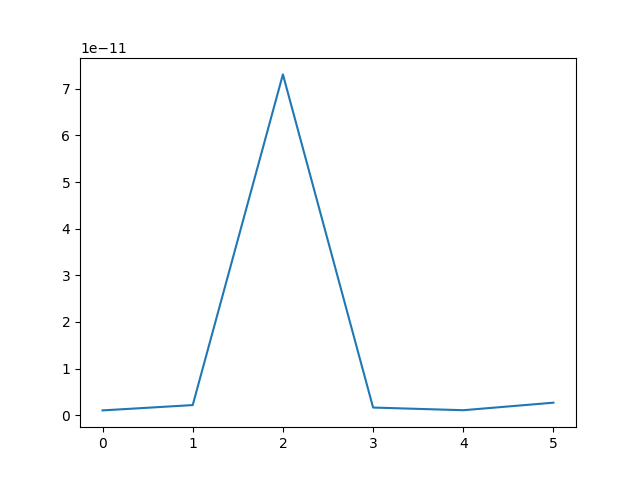

In [70]:
#location of packed h5
newDataDir      = '/drBiggerBoy/testing/'
fileName        = 'packedh5.hdf5'

datetimes_str = np.loadtxt(newDataDir + 'database.txt',
                        skiprows=1,
                        usecols=1,
                        delimiter=',',
                        dtype=str)
datetimes =[]

for date in datetimes_str:
    data = date[10]
    datetimes.append(datetime.strptime(date, ' %Y-%m-%d %H:%M:%S.%f'))

def freq2Idx(freq):
    #MHz
    return int(freq/(s.SAMPLE_RATE/2/1e6) * 2**23)


f               = h5py.File(newDataDir + fileName, 'r')

freqSpec = f['spec_W_chB'][freq2Idx(71.99993):freq2Idx(72.00015), 1]

timeSpec  = f['spec_W_chB'][freq2Idx(71.99993):freq2Idx(72.00015), :].mean(axis=0)
timeSpec2 = f['spec_W_chB'][freq2Idx(71.9):freq2Idx(72.900015), :].mean(axis=0)
timeSpec3 = f['spec_W_chB'][freq2Idx(100):freq2Idx(101), :].mean(axis=0)
timeSpec102p5MHz = f['spec_W_chB'][freq2Idx(102.4):freq2Idx(102.6), :].mean(axis=0)

spur105p5MHz  = f['spec_W_chB'][freq2Idx(102.4999):freq2Idx(102.5001), :].mean(axis=0)

plt.close('all')

plt.figure()
plt.title("72MHz Spur Time Series")
plt.plot(datetimes,10*np.log10(1000*timeSpec))
plt.ylabel('power dBm')
plt.xlabel('datetime')
plt.grid()

plt.figure()
plt.title("102.5 MHz Spur Time Series")
plt.plot(datetimes,10*np.log10(1000*spur105p5MHz))
plt.ylabel('power dBm')
plt.xlabel('datetime')
plt.grid()


plt.figure()
plt.title('No Spur Time Series')
plt.plot(datetimes, timeSpec2, label = "71.9MHz")
plt.plot(datetimes, timeSpec3, label = "100.5MHz")
plt.plot(datetimes, timeSpec102p5MHz, label = "102.5MHz")
plt.legend()
plt.grid()
plt.xlabel('datetimes')
plt.ylabel('Power (Watts)')

plt.figure()
plt.plot(freqSpec)



f.close()

In [5]:
nSigma = 5
order = 1
fc_numBins = 100

specFiltered = dr.filterSpec(diffSpec, fc_numBins=fc_numBins, order=order)
window = 1000

rollingMadArr = dr.rolling(specFiltered, window, 1, mad_np, numProc=48)

filter_fc           = 30 * window
filteredMadArr  = dr.filterSpec(rollingMadArr, order = 2, fc_numBins = filter_fc, type = 'lowpass')
diffFilterMadPadArr = dr.nanPad(filteredMadArr, window)
rollMadLim      = diffFilterMadPadArr * nSigma * 1.48

done mp


2 candidates


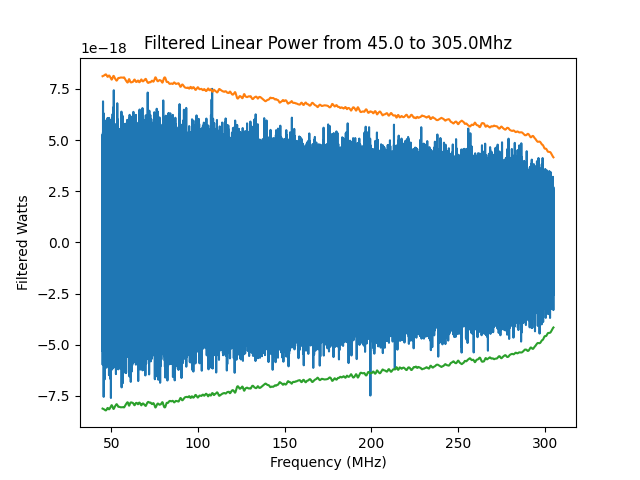

In [8]:
pltFreqStart = 45e6
pltFreqStop = 305e6
pltIdxStart = freq2Idx(pltFreqStart, freqs)
pltIdxStop = freq2Idx(pltFreqStop, freqs)

spurList_idx = ((np.abs(specFiltered) > rollMadLim)) 
candidateTotal = (spurList_idx[pltIdxStart:pltIdxStop].sum())
print(f"{candidateTotal} candidates")
#print((freqs[pltIdxStart:pltIdxStop][spurList_idx[pltIdxStart:pltIdxStop]]))

plt.close('all')


if 1:
    plt.figure()
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6, specFiltered[pltIdxStart:pltIdxStop]/1000)
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6,(rollMadLim)[pltIdxStart:pltIdxStop]/1000)
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6,-(rollMadLim)[pltIdxStart:pltIdxStop]/1000)
    plt.text(200,10e-15, f'{candidateTotal} candidates',size=16)
    plt.title(f"Filtered Linear Power from {pltFreqStart/1e6} to {pltFreqStop/1e6}Mhz")
    plt.xlabel('Frequency (MHz)')
    plt.ylabel('Filtered Watts')

if 0:
    plt.figure()
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6, specFiltered[pltIdxStart:pltIdxStop])
    plt.plot(freqs[pltIdxStart:pltIdxStop]/1e6,(rollMadLim)[pltIdxStart:pltIdxStop])
    plt.text(200,4e-12, f'{candidateTotal} candidates',size=16)
    plt.title(f"Filtered Linear Power from {pltFreqStart/1e6} to {pltFreqStop/1e6}Mhz")
    plt.xlabel('Frequency (MHz)')
    plt.ylabel('Watts')

